# **Equipo 2**

## **Proyecto: Cancer de mama en México**

### Análisis exploratorio y espacial de bases de datos de SICAM

#### Integrantes:
- Zoé Ariel García Martínez
- Atenea De La Cruz Brito
- Juan Luis Carrillo de la Cruz

A partir de la obteción y limpeza de los datos del SICAM es posible analizar las mastográfias hechas por estados, abarcando del 2013 al 2019, teniendo una falta de datos en el 2018 debido a que el enlace estaba caído.

Esta base de datos fue previamienta trabajada y se trabajara a partir de la siguiente forma:

In [58]:
# Importamos las librerias y obtenemos 
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from scipy.stats import skew, kurtosis
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn import metrics
import seaborn  as sns
import folium
import geopandas as gpd
sns.set(style='whitegrid')

In [2]:
sicam13_estado = pd.read_csv("../Equipo_2_P2_Analisis/DATA_CLEAN/SICAM/masto_2013_SICAM_estado.csv", index_col=0)
sicam13_estado.head()

,resultado,estado,count
0,Altamente Sugestiva a Malignidad,Aguascalientes,31
1,Altamente Sugestiva a Malignidad,Baja California,31
2,Altamente Sugestiva a Malignidad,Baja California Sur,2
3,Altamente Sugestiva a Malignidad,Campeche,25
4,Altamente Sugestiva a Malignidad,Chiapas,1


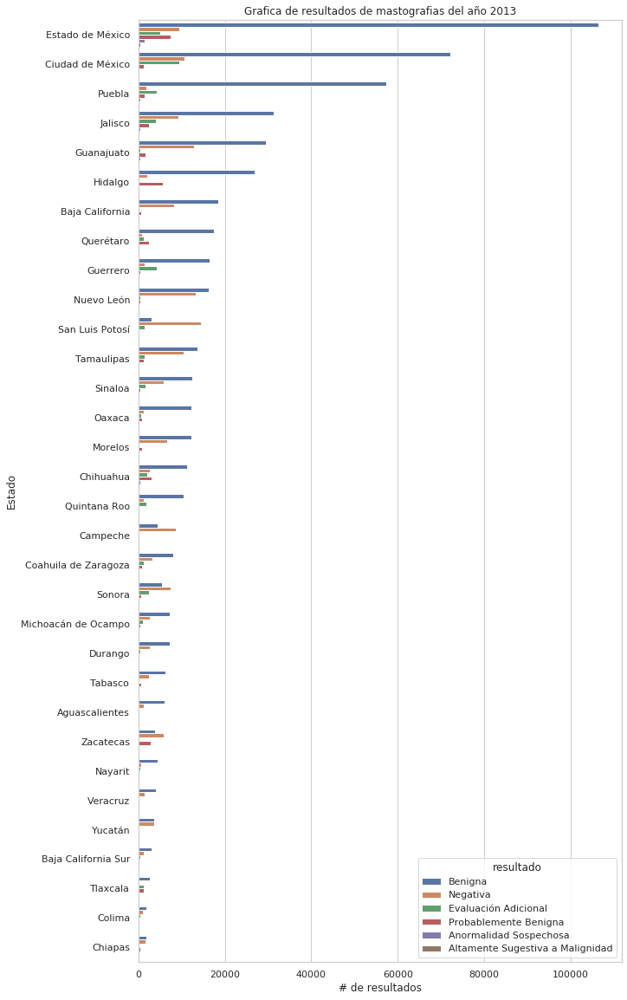

In [3]:
# Graficas de barras
fig = plt.figure(figsize=(10,20))
ax = sns.barplot(x='count', y='estado', data=sicam13_estado.sort_values(by='count', ascending=False), orient='h', hue='resultado') #dodge = false
ax.set_title('Grafica de resultados de mastografias del año 2013')
ax.set(xlabel='# de resultados', ylabel='Estado');

Ya que la grafica de barras nos indica una gran diferencia entre los estados, la mejor manera de comunicar este tipo de datos es hacerlo usando mapas. 

In [4]:
# cargamos el geojson con la geometria de los estados de México
mexico = '../Equipo_2_P2_Analisis/DATA/mexico.json'
fname = mexico
mxn = gpd.read_file(fname)
mxn = mxn[1:][['name', 'geometry']]
mxn = mxn.rename(columns= {'name': 'estado'})
mxn

,estado,geometry
1,Baja California,"MULTIPOLYGON (((-114.14750 28.00015, -114.2070..."
2,Baja California Sur,"MULTIPOLYGON (((-109.79843 24.15516, -109.8624..."
3,Coahuila,"POLYGON ((-99.80696 27.77142, -99.96720 27.640..."
4,Chihuahua,"POLYGON ((-106.50605 31.77026, -106.42895 31.7..."
5,Durango,"POLYGON ((-103.62726 26.64393, -103.32570 26.4..."
6,Sinaloa,"MULTIPOLYGON (((-108.88272 25.44318, -108.8188..."
7,Sonora,"MULTIPOLYGON (((-109.23137 26.26342, -109.2254..."
8,Zacatecas,"POLYGON ((-100.82844 24.56496, -100.86968 24.4..."
9,Nuevo León,"POLYGON ((-99.80696 27.77142, -99.74044 27.722..."
10,San Luis Potosí,"POLYGON ((-100.05727 23.24106, -100.08926 23.1..."


In [5]:
# realizamos la funcion de un mapa multicapa

def map_mul(jsn, data, var, count,  location, zoom, title='Titulo', res='Resultados'):
    '''
    Funcion que entrega un "Choropleth map" multicapa,
    útil para realizar mapas de diferentes variables
    en un mimso data set. Es necesario tener un geojson
    con los valores a usar (e.j. poligonos)
    
    jsn: geojson que contiene los valores espaciales
    data: Dataframe de los datos
    var: variable que queremos localizer
    count: conteo de los datos de la variable a usar
    title: titulo.
    res: Titulo de los resultados.
    location: centro del mapa [y,x]
    zoom: zoom de la capa
    
    Nota: por el momento solo funciona con geojson usado en 
    clase, falta poder dar las propiedad de forma correcta 
    en la variable 'key_on' de folium.Choropleth
    '''
    
    # Usamos un array con los nombres de las variables para el loop que preparara el mapa
    res = pd.unique(data[var])
    
    # usando folium realizamos el mapa con diferentes capas
    mymap =  folium.Map(location=location, zoom_start=zoom, width="100%", height='100%')
    for i in range(0,len(res)):
        folium.Choropleth(
            geo_data = jsn,
            name=f'{title} {res[i]}',
            data=data[data[var]  == res[i]],
            columns=[var, count],
            key_on='feature.properties.estado',
            fill_color='YlGn',
            fill_opacity=0.7,
            line_opacity=0.2,
            legend_name=f'{res} {res[i]}'
        ).add_to(mymap)
        
    folium.LayerControl().add_to(mymap)
    
    return mymap


# Intente realizar la funcion y arroja el mapa, pero no imprime nada a pesar de darme el bjeto de folium.

In [6]:
# renombramos los datos y los preparamos para el mapa
renombre = {
    'Coahuila de Zaragoza': 'Coahuila',
    'Ciudad de México': 'Distrito Federal',
    'Michoacán de Ocampo': 'Michoacán',
    'Veracruz de Ignacio de la Llave': 'Veracruz',
    'Estado de México': 'México'
}

sicam13_estado = sicam13_estado.replace({"estado": renombre})

In [7]:
# Usamos un array con los nombres de las variables para el loop que preparara el mapa
res = pd.unique(sicam13_estado['resultado'])

# usando folium realizamos el mapa con diferentes capas
mymap =  folium.Map(location=[25, -100], zoom_start=4.4, width="100%", height='100%')

for i in range(0,len(res)):
    folium.Choropleth(
        geo_data = mxn,
        name=f'Resultados mastografias {res[i]}',
        data=sicam13_estado[sicam13_estado['resultado']  == res[i]],
        columns=['estado', 'count'],
        key_on='feature.properties.estado',
        fill_color='YlGn',
        fill_opacity=0.7,
        line_opacity=0.2,
        legend_name=f'Resultados mastografias {res[i]}'
    ).add_to(mymap)

folium.LayerControl().add_to(mymap)

mymap

A partir del mapa anterior, de forma interactiva es posible ver, según los diferents resultados, que estados tienen una mayor o un menor numero de tumores benignos, por poner un ejemplo. Se realizaran mapas para los siguientes años.

In [8]:
#  2014
sicam14_estado = pd.read_csv("../Equipo_2_P2_Analisis/DATA_CLEAN/SICAM/masto_2014_SICAM_estado.csv", index_col=0)
sicam14_estado = sicam14_estado.replace({"estado": renombre})

res = pd.unique(sicam14_estado['resultado'])

mymap =  folium.Map(location=[25, -100], zoom_start=4.3, width="100%", height='100%')

for i in range(0,len(res)):
    folium.Choropleth(
        geo_data = mxn,
        name=f'Resultados mastografias {res[i]}',
        data=sicam14_estado[sicam14_estado['resultado']  == res[i]],
        columns=['estado', 'count'],
        key_on='feature.properties.estado',
        fill_color='YlGn',
        fill_opacity=0.7,
        line_opacity=0.2,
        legend_name=f'Resultados mastografias {res[i]}'
    ).add_to(mymap)

folium.LayerControl().add_to(mymap)

mymap


In [9]:
#  2015
sicam15_estado = pd.read_csv("../Equipo_2_P2_Analisis/DATA_CLEAN/SICAM/masto_2015_SICAM_estado.csv", index_col=0)
sicam15_estado = sicam15_estado.replace({"estado": renombre})

res = pd.unique(sicam15_estado['resultado'])

mymap =  folium.Map(location=[25, -100], zoom_start=4.3, width="100%", height='100%')

for i in range(0,len(res)):
    folium.Choropleth(
        geo_data = mxn,
        name=f'Resultados mastografias {res[i]}',
        data=sicam15_estado[sicam15_estado['resultado']  == res[i]],
        columns=['estado', 'count'],
        key_on='feature.properties.estado',
        fill_color='YlGn',
        fill_opacity=0.7,
        line_opacity=0.2,
        legend_name=f'Resultados mastografias {res[i]}'
    ).add_to(mymap)

folium.LayerControl().add_to(mymap)

mymap


In [10]:
#  2016
sicam16_estado = pd.read_csv("../Equipo_2_P2_Analisis/DATA_CLEAN/SICAM/masto_2016_SICAM_estado.csv", index_col=0)
sicam16_estado = sicam16_estado.replace({"estado": renombre})

res = pd.unique(sicam16_estado['resultado'])

mymap =  folium.Map(location=[25, -100], zoom_start=4.3, width="100%", height='100%')

for i in range(0,len(res)):
    folium.Choropleth(
        geo_data = mxn,
        name=f'Resultados mastografias {res[i]}',
        data=sicam16_estado[sicam16_estado['resultado']  == res[i]],
        columns=['estado', 'count'],
        key_on='feature.properties.estado',
        fill_color='YlGn',
        fill_opacity=0.7,
        line_opacity=0.2,
        legend_name=f'Resultados mastografias {res[i]}'
    ).add_to(mymap)

folium.LayerControl().add_to(mymap)

mymap

In [11]:
#  2017
sicam17_estado = pd.read_csv("../Equipo_2_P2_Analisis/DATA_CLEAN/SICAM/masto_2017_SICAM_estado.csv", index_col=0)
sicam17_estado = sicam17_estado.replace({"estado": renombre})

res = pd.unique(sicam17_estado['resultado'])

mymap =  folium.Map(location=[25, -100], zoom_start=4.3, width="100%", height='100%')

for i in range(0,len(res)):
    folium.Choropleth(
        geo_data = mxn,
        name=f'Resultados mastografias {res[i]}',
        data=sicam17_estado[sicam17_estado['resultado']  == res[i]],
        columns=['estado', 'count'],
        key_on='feature.properties.estado',
        fill_color='YlGn',
        fill_opacity=0.7,
        line_opacity=0.2,
        legend_name=f'Resultados mastografias {res[i]}'
    ).add_to(mymap)

folium.LayerControl().add_to(mymap)

mymap

In [12]:
#  2019
sicam19_estado = pd.read_csv("../Equipo_2_P2_Analisis/DATA_CLEAN/SICAM/masto_2019_SICAM_estado.csv", index_col=0)
sicam19_estado = sicam19_estado.replace({"estado": renombre})

res = pd.unique(sicam19_estado['resultado'])

mymap =  folium.Map(location=[25, -100], zoom_start=4.3, width="100%", height='100%')

for i in range(0,len(res)):
    folium.Choropleth(
        geo_data = mxn,
        name=f'Resultados mastografias {res[i]}',
        data=sicam19_estado[sicam19_estado['resultado']  == res[i]],
        columns=['estado', 'count'],
        key_on='feature.properties.estado',
        fill_color='YlGn',
        fill_opacity=0.7,
        line_opacity=0.2,
        legend_name=f'Resultados mastografias {res[i]}'
    ).add_to(mymap)

folium.LayerControl().add_to(mymap)

mymap

A partir de los mapas es posible visualizar los datos para cada año y su distribución en los diferentes estados de la Republica Mexicana, pero ahora veremos los datos para el rango de 2013 a 2019, cuantas mastografias de hicieron de acuerdo a la edad, en diferentes graficos. Además vemos que con los años aumentaron otras opciones en los resultados, lo cual podría estar relacionado con algunas mejoras en los equipos o nuevas clasificaciones para llevar a cabo análisis estadísticos.  

## Análisis para todo México

A continuación presentamos nuestro DS del SICAM para el rango de años entre el 2013-2019, donde haremos un dataframe con los resultados.

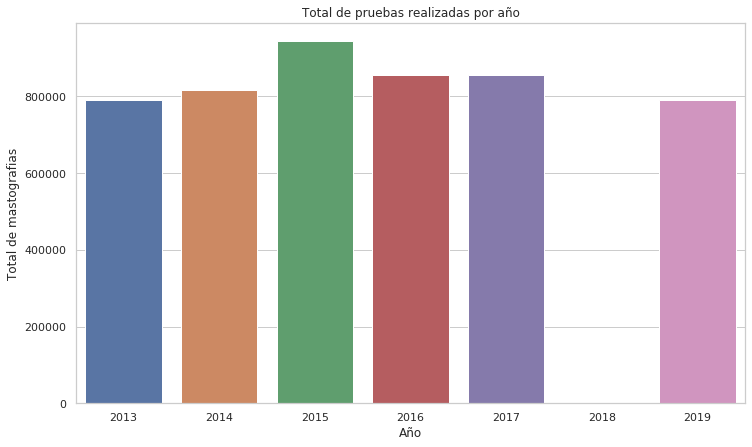

In [13]:
# ahora analizameros usando un grafica de barras con el total de mastografias realizadas por año
conteo = {'Año': list(range(2013, 2020)), 
          'Numero de pruebas': [sicam13_estado['count'].sum(), sicam14_estado['count'].sum(), 
                                sicam15_estado['count'].sum(), sicam16_estado['count'].sum(),
                                sicam17_estado['count'].sum(), np.nan, sicam19_estado['count'].sum()]}
conteo = pd.DataFrame(conteo)


fig = plt.figure(figsize=(12,7))
ax = sns.barplot(x='Año', y='Numero de pruebas', data=conteo)
ax.set_title('Total de pruebas realizadas por año')
ax.set(ylabel='Total de mastografias');

La grafica nos muestra que existia un aumento en el numero de mastografías aplicadas, pero a partir del 2015 pareciera que estos estudios empezaron a disminuir.

In [14]:
# ahora analizaremos el total de resultados benignos y agresivos para estos años

# Hacems un DF con todos los datos
masto = sicam13_estado.append([sicam14_estado, sicam15_estado, sicam16_estado, sicam17_estado, sicam19_estado]).reset_index(drop=True)
masto.tail()

,resultado,estado,count
1443,Riesgo Moderado de Malignidad,Tabasco,4
1444,Riesgo Moderado de Malignidad,Tamaulipas,19
1445,Riesgo Moderado de Malignidad,Tlaxcala,1
1446,Riesgo Moderado de Malignidad,Yucatán,2
1447,Riesgo Moderado de Malignidad,Zacatecas,9


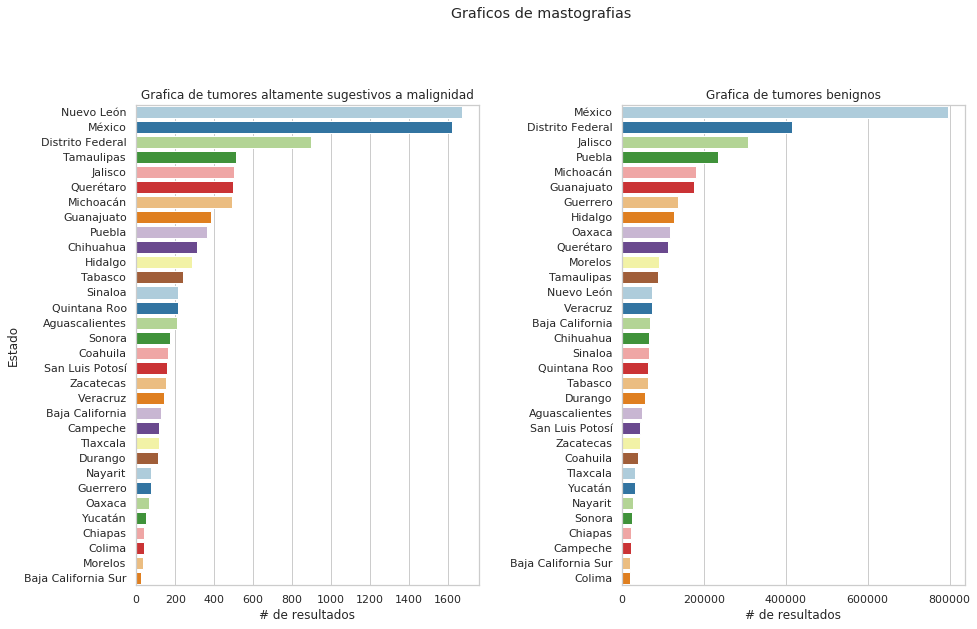

In [15]:
# analizamos usando una grafica de barras

masto_agre = masto[masto['resultado'] == 'Altamente Sugestiva a Malignidad']
masto_agre = masto_agre.groupby('estado').sum()
masto_agre = masto_agre.reset_index()
masto_agre = masto_agre.sort_values(by='count', ascending=False)

masto_beni = masto[masto['resultado'] == 'Benigna']
masto_beni = masto_beni.groupby('estado').sum()
masto_beni = masto_beni.reset_index()
masto_beni = masto_beni.sort_values(by='count', ascending=False)

fig, axes = plt.subplots(1, 2, sharex=False, figsize=(15,10))
fig.suptitle('Graficos de mastografias')
fig.tight_layout(pad=9)
sns.barplot(x='count', y='estado', data=masto_agre, orient='h', palette="Paired", ax=axes[0])
axes[0].set_title('Grafica de tumores altamente sugestivos a malignidad')
axes[0].set(xlabel='# de resultados', ylabel='Estado')
axes[0].locator_params(axis='x', nbins=10)
sns.barplot(x='count', y='estado', data=masto_beni, orient='h', palette="Paired", ax=axes[1])
axes[1].set_title('Grafica de tumores benignos')
axes[1].set(xlabel='# de resultados', ylabel='')
axes[1].locator_params(axis='x', nbins=5);

Como observamos, los resultados difieren un entre otros, pues el caso de Nuevo León es un poco curioso, pues en el total de tumores benignos se encuentra muy por debajo de los que presentan gran numero de resultados de este tipo de tumores, sin embargo, ¿Cómo se observa ese cambio en una distribucio espacial?

In [16]:
# Cambiamos el nombre de alguas columnas con el diccionario usado anteriormente
masto_agre = masto_agre.replace({'estado': renombre})
masto_beni = masto_beni.replace({'estado': renombre})

In [17]:
mymap =  folium.Map(location=[25, -100], zoom_start=4.3, width="100%", height='100%')

folium.Choropleth(
    geo_data = mxn,
    name=f'Resultados mastografias: Altamente Sugestiva a Malignidad',
    data=masto_agre,
    columns=['estado', 'count'],
    key_on='feature.properties.estado',
    fill_color='YlGn',
    fill_opacity=1,
    line_opacity=0.2,
    legend_name=f'Resultados mastografias: Altamente Sugestiva a Malignidad'
).add_to(mymap)


folium.Choropleth(
    geo_data = mxn,
    name=f'Resultados mastografias: Benignas',
    data=masto_beni,
    columns=['estado', 'count'],
    key_on='feature.properties.estado',
    fill_color='YlGn',
    fill_opacity=1,
    line_opacity=0.2,
    legend_name=f'Resultados mastografias: Benignas'
).add_to(mymap)

folium.LayerControl().add_to(mymap)

mymap

Ahora podemos observar el cambio de color al encender o apagar las capas del mapa anterior, y también podemos darnos cuenta el porque el estado de Nuevo León podría llegar a ser preocupante.

La otra pregunta que nos hacemos es la edades en las cuales las mujeres se realizan mastografías, para eso es necesario importar nuestros DS que se han limpiado previamente.

In [18]:
# Cargamos los dataset
sicam13_edad = pd.read_csv("../Equipo_2_P2_Analisis/DATA_CLEAN/SICAM/masto_2013_SICAM_edad.csv", index_col=0)
sicam14_edad = pd.read_csv("../Equipo_2_P2_Analisis/DATA_CLEAN/SICAM/masto_2014_SICAM_edad.csv", index_col=0)
sicam15_edad = pd.read_csv("../Equipo_2_P2_Analisis/DATA_CLEAN/SICAM/masto_2015_SICAM_edad.csv", index_col=0)
sicam16_edad = pd.read_csv("../Equipo_2_P2_Analisis/DATA_CLEAN/SICAM/masto_2016_SICAM_edad.csv", index_col=0)
sicam17_edad = pd.read_csv("../Equipo_2_P2_Analisis/DATA_CLEAN/SICAM/masto_2017_SICAM_edad.csv", index_col=0)
sicam19_edad = pd.read_csv("../Equipo_2_P2_Analisis/DATA_CLEAN/SICAM/masto_2019_SICAM_edad.csv", index_col=0)

# Juntamos los datos
sicam_edad = sicam13_edad.append([sicam14_edad,sicam15_edad,sicam16_edad,sicam17_edad,sicam19_edad])

sicam_edad_group = sicam_edad.groupby(["resultado", "edad"])["count"].sum()
sicam_edad_group = sicam_edad_group.reset_index()
sicam_edad_group["edad"] = pd.to_numeric(sicam_edad_group["edad"], downcast="integer")

In [19]:
# Haceos una lista para el loop de las barras cumulativas
res = pd.unique(sicam_edad_group["resultado"])

# Una lista con varios colores para la paleta
col_pl = ["C0", "C1", "C2", "deepskyblue", "c", "darkorange", "firebrick", "ivory", "k"]

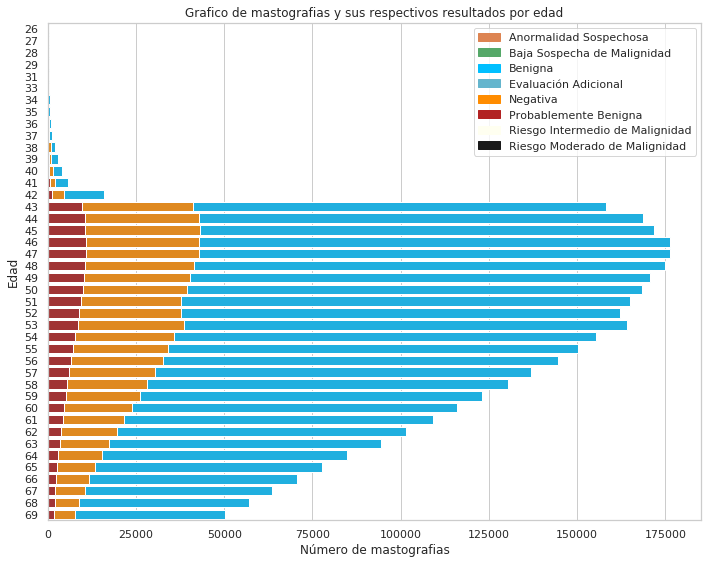

In [20]:
# revisamos usando un histograma los rangos de edades

fig, ax = plt.subplots(figsize=(10,8))

leg = []
for i in range(1, len(res)):
    sicam_edad_fil = sicam_edad_group[sicam_edad_group['resultado'] == res[i]]
    sns.barplot(x='count', y='edad', orient="h", data=sicam_edad_fil, color=col_pl[i])
    leg.append(mpatches.Patch(color=col_pl[i], label=res[i]))

ax.set_xlabel('Número de mastografias')
ax.set_title('Grafico de mastografias y sus respectivos resultados por edad')
ax.set_ylabel('Edad')
ax.legend(handles=leg)
plt.tight_layout()

plt.show()

En esta ultima gráfica podemos observar que después de los 43 años, existe un aumento muy considerable en los estudios de mastografías, y de igual forma, los resultados nos indican que podemos tener una mayor incidencia de tumores en las mujeres.

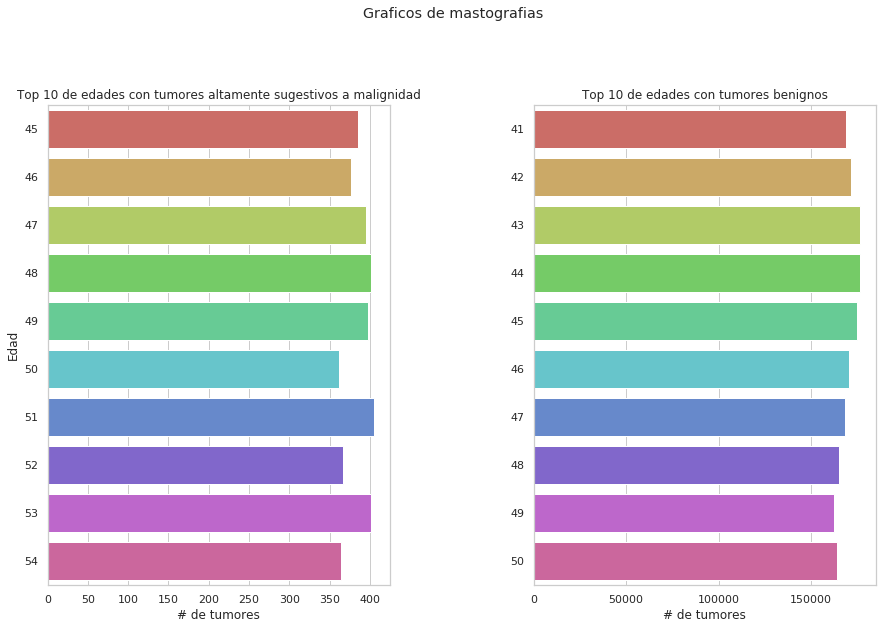

In [21]:
# Analizaremos cuales son las edades que presentan una mayor y menor cantidad de resultados benignos
# de acuerdo a la edad.

edad_top10_ben = sicam_edad_group[sicam_edad_group["resultado"] == "Benigna"].sort_values(by="count",ascending =False).head(10)

edad_top10_mal = sicam_edad_group[sicam_edad_group["resultado"] == "Altamente Sugestiva a Malignidad"].sort_values(by="count",ascending =False).head(10)

fig, axes = plt.subplots(1, 2, sharex=False, figsize=(15,10))
fig.suptitle('Graficos de mastografias')
fig.tight_layout(pad=9)
sns.barplot(x='count', y='edad', data=edad_top10_mal, orient='h', palette="hls", ax=axes[0])
axes[0].set_title('Top 10 de edades con tumores altamente sugestivos a malignidad')
axes[0].set(xlabel='# de tumores', ylabel='Edad')
axes[0].locator_params(axis='x', nbins=10)

sns.barplot(x='count', y='edad', data=edad_top10_ben, orient='h', palette="hls", ax=axes[1])
axes[1].set_title('Top 10 de edades con tumores benignos')
axes[1].set(xlabel='# de tumores', ylabel='')
axes[1].locator_params(axis='x', nbins=5);

Con esto podemos observar algunas de las edades con mayor numero de resultados.

De la misma manera podemos ver cuales son las edades que presentan menor numero de resultados con tumores altamente sugestivos a malignidad y benignos.

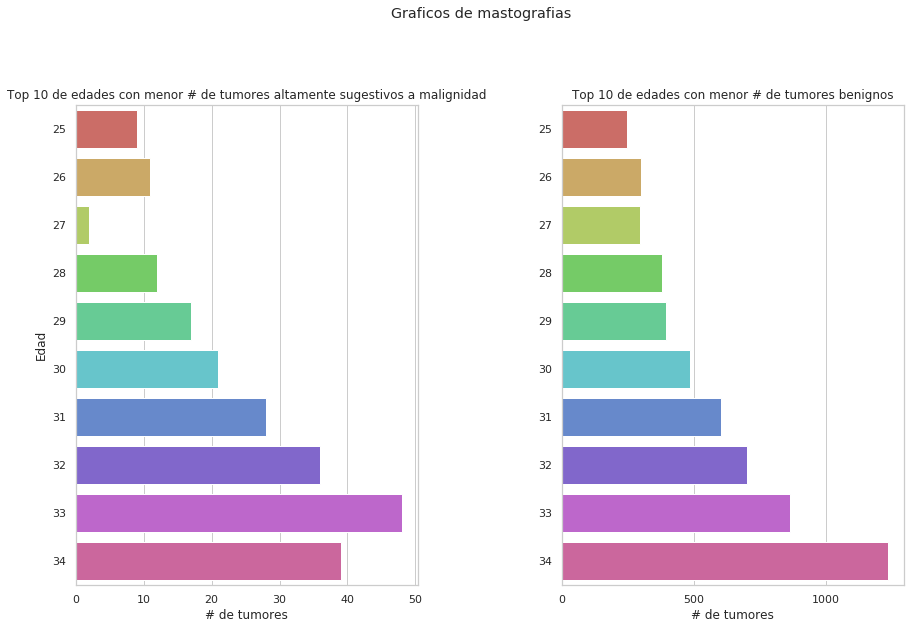

In [22]:
edad_less10_ben = sicam_edad_group[sicam_edad_group["resultado"] == "Benigna"].sort_values(by="count",ascending =False).tail(10)

edad_less10_mal = sicam_edad_group[sicam_edad_group["resultado"] == "Altamente Sugestiva a Malignidad"].sort_values(by="count",ascending =False).tail(10)

fig, axes = plt.subplots(1, 2, sharex=False, figsize=(15,10))
fig.suptitle('Graficos de mastografias')
fig.tight_layout(pad=9)
sns.barplot(x='count', y='edad', data=edad_less10_mal, orient='h', palette="hls", ax=axes[0])
axes[0].set_title('Top 10 de edades con menor # de tumores altamente sugestivos a malignidad')
axes[0].set(xlabel='# de tumores', ylabel='Edad')
axes[0].locator_params(axis='x', nbins=10)

sns.barplot(x='count', y='edad', data=edad_less10_ben, orient='h', palette="hls", ax=axes[1])
axes[1].set_title('Top 10 de edades con menor # de tumores benignos')
axes[1].set(xlabel='# de tumores', ylabel='')
axes[1].locator_params(axis='x', nbins=5);

A partir de las gráficas presentadas anteriormente, es posible concluir que a mayor edad mayor es el número de tumores, sin embargo, debemos tener cuidado porque el número de pruebas en edades temprana tambiés mucho menor, como lo presenta el gráfico de las edades.

## Ahora analizaremos los datos de morbilidad en México

In [23]:
morbi2013 = pd.read_csv("../Equipo_2_P2_Analisis/DATA_CLEAN/Morbilidad_2013_2019_clean/morbilidad_2013_clean.csv", index_col=0)
morbi2013.head()

,estado,< 1,1 - 4,5 - 9,10 - 14,15 - 19,20 - 24,25 - 44,45 - 49,50 - 59,60 - 64,65 y +,incidencia
0,Campeche,0.0,0.0,0.0,0.00,0.00,0.00,58.10,264.16,258.38,342.79,191.92,76.25
1,Aguascalientes,0.0,0.0,0.0,0.00,0.00,3.43,21.42,110.68,108.21,164.13,115.95,33.04
2,Jalisco,0.0,0.0,0.0,0.28,1.12,1.99,27.16,110.88,89.91,141.10,72.41,32.39
3,Veracruz,0.0,0.0,0.0,0.00,2.68,5.67,25.41,69.23,90.19,96.98,66.66,29.85
4,San Luis Potosí,0.0,0.0,0.0,0.00,0.00,0.81,28.29,88.65,103.23,101.62,46.06,28.31


Para tener un control, realizaremos un group_by para sacar el numero de mastografías, por cada año y juntarlo en un data set

In [24]:
# cargamos los datos de morbilidad
morbi2014 = pd.read_csv("../Equipo_2_P2_Analisis/DATA_CLEAN/Morbilidad_2013_2019_clean/morbilidad_2014_clean.csv", index_col=0)
morbi2015 = pd.read_csv("../Equipo_2_P2_Analisis/DATA_CLEAN/Morbilidad_2013_2019_clean/morbilidad_2015_clean.csv", index_col=0)
morbi2016 = pd.read_csv("../Equipo_2_P2_Analisis/DATA_CLEAN/Morbilidad_2013_2019_clean/morbilidad_2016_clean.csv", index_col=0)
morbi2017 = pd.read_csv("../Equipo_2_P2_Analisis/DATA_CLEAN/Morbilidad_2013_2019_clean/morbilidad_2017_clean.csv", index_col=0)
morbi2018 = pd.read_csv("../Equipo_2_P2_Analisis/DATA_CLEAN/Morbilidad_2013_2019_clean/morbilidad_2018_clean.csv", index_col=0)
morbi2019 = pd.read_csv("../Equipo_2_P2_Analisis/DATA_CLEAN/Morbilidad_2013_2019_clean/morbilidad_2019_clean.csv", index_col=0)

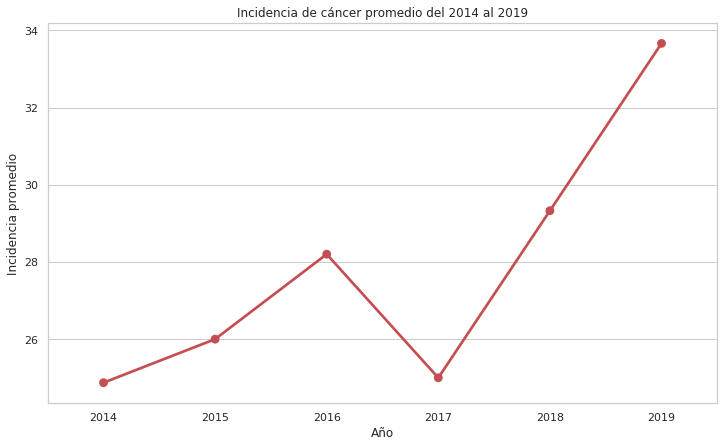

In [25]:
# Hacemos una lista con las variables
morbi_ls = [morbi2014,morbi2015,morbi2016,morbi2017,morbi2018,morbi2019]

#analizamos en el tiempo los datos de morbilidad, si existe un aumento
avg_year = []

for i in range(0, len(morbi_ls)):
    f = morbi_ls[i]["incidencia"].mean()
    avg_year.append(f)
avg_year
avg_year = {'Año': list(range(2014, 2020)), 
          'Incidencia promedio': avg_year }

avg_year = pd.DataFrame(avg_year)


fig = plt.figure(figsize=(12,7))
ax = sns.pointplot(x='Año', y='Incidencia promedio', data=avg_year, color="r")
ax.set_title('Incidencia de cáncer promedio del 2014 al 2019')
ax.set(ylabel='Incidencia promedio');


In [27]:
# Se hace un DS con todos los datos 
morbi = morbi2013.append([morbi2014, morbi2015, morbi2016, morbi2017, morbi2018, morbi2019])

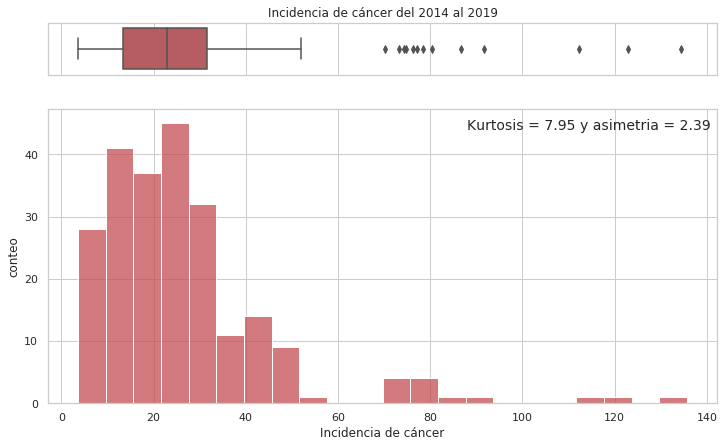

In [28]:
# Analizamos el histograma y sus valores de kurtosis y asimetria

kur_mor = kurtosis(morbi["incidencia"])
asi_mor = skew(morbi["incidencia"])

fig, (ax_box, ax_hist) = plt.subplots(2,sharex=True, gridspec_kw={"height_ratios": (0.15, 0.85)}, figsize=(12,7))

                                     
# Graficos
sns.boxplot(data=morbi, x="incidencia", ax=ax_box, color="r")
sns.histplot(data=morbi, x="incidencia", binwidth=6, ax=ax_hist, color="r")

# Labels de las graficas
ax_box.set_title('Incidencia de cáncer del 2014 al 2019')
ax_box.set(xlabel="")
ax_hist.text(88, 44, f'Kurtosis = {round(kur_mor, 2)} y asimetria = {round(asi_mor,2)}', fontsize=14)
ax_hist.set(ylabel='conteo', xlabel="Incidencia de cáncer");


A partir del histograma y los valores de Curtosis y Asimetría podemos observar que la distribucion de la incidencia es asimetria positiva leptocúrtica. Esto se puede ver muy claramente en la grafica de Boxplot donde se ven valores de outliers que pueden ser los causantes del sesgo que encontramos en los datos.

### Ahora analizaremos si existe una relación entre el número de mastografías y la incidencia por estado. 

In [29]:
# hacemos la agrupacion y obtenemos los valores promedio de la incidencia
morbi_estado = morbi.groupby("estado")["incidencia"].mean()
morbi_estado = morbi_estado.to_frame()
morbi_estado = morbi_estado.reset_index()
morbi_estado = morbi_estado.drop(26)

# Tenemos que hacer un rename de la ciudad de México a Distrito Federal para asociar a nuestro geojson
morbi_estado = morbi_estado.replace({"estado": renombre})

In [31]:
# creamos un mapa de incidencia promedio para los años 2014-2016

mymap =  folium.Map(location=[25, -100], zoom_start=4.5, width="100%", height='100%')

folium.Choropleth(
    geo_data = mxn,
    name=f'Incidencia de cáncer',
    data=morbi_estado,
    columns=['estado', 'incidencia'],
    key_on='feature.properties.estado',
    fill_color='YlGn',
    fill_opacity=1,
    line_opacity=0.2,
    legend_name=f'Incidecia de cáncer promedio'
).add_to(mymap)



folium.LayerControl().add_to(mymap)

mymap

In [210]:
# Generamos un DS con el promedio de los datos de mastografias
masto_estado = masto.groupby("estado")['count'].mean()
masto_estado = masto_estado.to_frame()
masto_estado = masto_estado.reset_index()
masto_estado.head()

,estado,count
0,Aguascalientes,1170.265306
1,Baja California,2240.382979
2,Baja California Sur,818.722222
3,Campeche,1182.953488
4,Chiapas,883.000000


In [211]:
# ahora hacemos un merge con el DS de incidencia de cáncer
morbi_masto = morbi_estado.merge(masto_estado)
morbi_masto.head()

,estado,incidencia,count
0,Aguascalientes,70.047143,1170.265306
1,Baja California,27.981429,2240.382979
2,Baja California Sur,25.018571,818.722222
3,Campeche,95.078571,1182.953488
4,Chiapas,15.611429,883.000000


In [212]:
# Ahora realizaremos la regresion lineal
lr = LinearRegression()

# Y obtenemos nuestros datos de prueba y entrenamiento
X = morbi_masto["count"].to_frame()
Y = morbi_masto["incidencia"]


In [213]:
lr.fit(X, Y)

LinearRegression()

In [214]:
y_predict = lr.predict(X)
y_predict

array([29.00464818, 27.8767755 , 29.37516429, 28.99127521, 29.3074174 ,
       27.68105277, 18.77458312, 28.85658143, 29.5000545 , 28.31689573,
       24.5642577 , 26.17633392, 26.73682676, 21.7170717 , 25.24040794,
       26.99812176,  8.82964491, 29.40142155, 27.13349303, 27.18900215,
       23.91787232, 26.77840184, 28.306661  , 27.49071559, 27.81733704,
       28.70946468, 27.95192137, 26.71503272, 28.94733416, 28.00398354,
       28.61688214, 28.33764979])

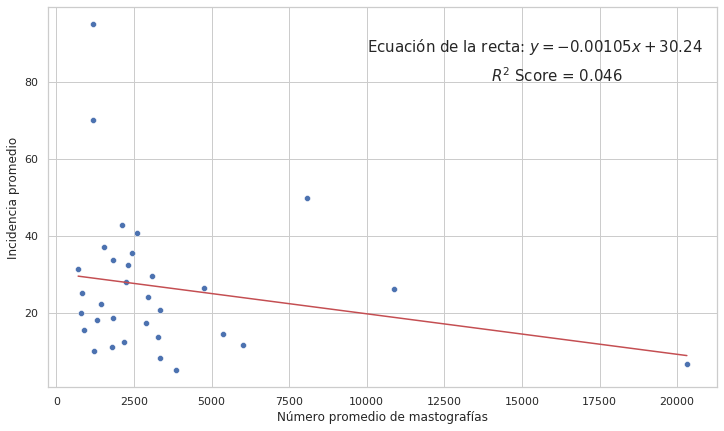

In [215]:
# obtenemos el slope y el itercept
inter = round(lr.intercept_, 2)
slp = round(lr.coef_[0], 5)
r2 = round(metrics.r2_score(Y, y_predict), 3)

fig = plt.figure(figsize=(12,7))
ax = sns.scatterplot(x=X["count"], y=Y, color='b')
ax = sns.lineplot(x=X["count"], y=y_predict, color='r')
ax.text(10000, 88, r'Ecuación de la recta: $y = {{{0}}}x + {{{1}}}$'.format(slp,inter), fontsize=15)
ax.text(14000, 80, r'$R^2$ Score = ${{{0}}}$'.format(r2), fontsize=15)
ax.set(ylabel='Incidencia promedio', xlabel="Número promedio de mastografías");

A partir del análisis de regresió lineal simple podemos observar que los diferentes estados en México no encuentran una relación entre la incidencia de cáncer. Sin embargo, hay que considerar que aquí se tienen todos los datos, y como vimos, la aparición de muchos tumores altamente sugestivos a malignidad en el estado de Nuevo León podría ser un factor a considerarse, entonces, filtraremos los datos de mastografías con tumores altamente sugestivos a malignidad y veamos que sucede.

In [216]:
# Generamos un DS con el total de los datos de mastografias
masto_estado = masto[masto["resultado"] == "Altamente Sugestiva a Malignidad"].groupby("estado")['count'].mean()
masto_estado = masto_estado.to_frame()
masto_estado = masto_estado.reset_index()
masto_estado.head()

,estado,count
0,Aguascalientes,35.166667
1,Baja California,21.166667
2,Baja California Sur,5.200000
3,Campeche,19.666667
4,Chiapas,8.200000


In [217]:
# ahora hacemos un merge con el DS de incidencia de cáncer
morbi_masto = morbi_estado.merge(masto_estado)
morbi_masto.head()

,estado,incidencia,count
0,Aguascalientes,70.047143,35.166667
1,Baja California,27.981429,21.166667
2,Baja California Sur,25.018571,5.200000
3,Campeche,95.078571,19.666667
4,Chiapas,15.611429,8.200000


In [218]:
# Ahora realizaremos la regresion lineal
lr = LinearRegression()

# Y obtenemos nuestros datos de prueba y entrenamiento
X = morbi_masto["count"].to_frame()
Y = morbi_masto["incidencia"]


In [219]:
lr.fit(X, Y)

LinearRegression()

In [220]:
y_predict = lr.predict(X)
y_predict

array([27.48127231, 28.13472191, 28.87996562, 28.20473437, 28.73994071,
       26.68779779, 22.14476724, 27.83911376, 28.82706732, 28.23585102,
       26.15103562, 28.53923833, 26.91339349, 25.22531535, 25.28754865,
       28.77728068, 16.51265401, 28.51590084, 16.11591675, 28.62480911,
       26.2988397 , 25.26421116, 27.47349315, 27.89356789, 27.46571399,
       27.7691013 , 27.24789745, 25.13196541, 28.22029269, 28.01025532,
       28.72593822, 27.92468454])

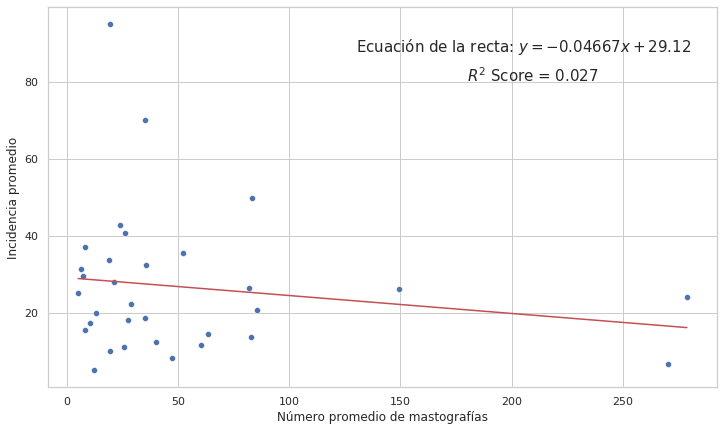

In [227]:
# obtenemos el slope y el itercept
inter = round(lr.intercept_, 2)
slp = round(lr.coef_[0], 5)
r2 = round(metrics.r2_score(Y, y_predict), 3)

fig = plt.figure(figsize=(12,7))
ax = sns.scatterplot(x=X["count"], y=Y, color='b')
ax = sns.lineplot(x=X["count"], y=y_predict, color='r')
ax.text(130, 88, r'Ecuación de la recta: $y = {{{0}}}x + {{{1}}}$'.format(slp,inter), fontsize=15)
ax.text(180, 80, r'$R^2$ Score = ${{{0}}}$'.format(r2), fontsize=15)
ax.set(ylabel='Incidencia promedio', xlabel="Número promedio de mastografías");

Con este resultado observamos que no existen ninguna relación entre la incidencia de cáncer y el número de mastografías que presentan un "Altamente Sugestiva a Malignidad", por lo que estas variables son independientes, es decir, el número de pruebas no va a arrojar nuevos valores de incidencia.

***Lo que si es una realidad, es que a lo largo del tiempo se han disminuido un poco el número total de mastografías realizadas, y la incidencia de cáncer ha aumentado con los años***